In [1]:
import xml.etree.ElementTree as ET

# Load the XML file
tree = ET.parse('ch2_tmc_ndn_20240226T2312096145_d_oth_d18.xml')
root = tree.getroot()

# Print the root element
print(root.tag)

# Iterate through the elements
for child in root:
    print(child.tag, child.attrib)

# Access specific elements
for element in root.findall('element_name'):
    print(element.text)

{http://pds.nasa.gov/pds4/pds/v1}Product_Observational
{http://pds.nasa.gov/pds4/pds/v1}Identification_Area {}
{http://pds.nasa.gov/pds4/pds/v1}Observation_Area {}
{http://pds.nasa.gov/pds4/pds/v1}File_Area_Observational {}


In [2]:
import xml.etree.ElementTree as ET

# Load the XML file
tree = ET.parse('ch1_tmc_ndn_20090606T0103103122_d_dtm_apl.xml')
root = tree.getroot()

# Print the root element
print(root.tag)

# Iterate through the elements
for child in root:
    print(child.tag, child.attrib)

# Access specific elements
for element in root.findall('element_name'):
    print(element.text)

{http://pds.nasa.gov/pds4/pds/v1}Product_Observational
{http://pds.nasa.gov/pds4/pds/v1}Identification_Area {}
{http://pds.nasa.gov/pds4/pds/v1}Observation_Area {}
{http://pds.nasa.gov/pds4/pds/v1}File_Area_Observational {}


In [6]:
import rasterio
from rasterio.plot import show
import numpy as np
import matplotlib.pyplot as plt

# Load the DTM file
dtm_path = 'ch2_tmc_ndn_20240226T2312096145_d_oth_d18'  # Replace with your DTM file path
dtm = rasterio.open(dtm_path)

# Read the DTM data as an array
dtm_data = dtm.read(1)

# Calculate hillshade
x, y = np.gradient(dtm_data)
slope = np.pi/2.0 - np.arctan(np.sqrt(x*x + y*y))
azimuth = np.pi/4.0
hillshade = np.sin(slope) * np.cos(azimuth)

# Plot the hillshade
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(hillshade, cmap='gray')
ax.set_title('Hillshade')
plt.show()

# Plot the elevation data with color ramp
fig, ax = plt.subplots(figsize=(10, 10))
elevation = ax.imshow(dtm_data, cmap='terrain')
fig.colorbar(elevation, ax=ax, label='Elevation (meters)')
ax.set_title('Topographic Map')
plt.show()


RasterioIOError: ch2_tmc_ndn_20240226T2312096145_d_oth_d18: No such file or directory

In [1]:
from PIL import Image
import numpy as np

# Load the TIFF image
tif_image = Image.open('ch2_tmc_ndn_20240226T2312096145_d_oth_d1.tif')

# Convert the image to a NumPy array
image_array = np.array(tif_image)

# Save the NumPy array to a .npy file
np.save('path/to/your/output.npy', image_array)

print("Conversion complete. The .npy file has been saved.")

DecompressionBombError: Image size (1013937184 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.

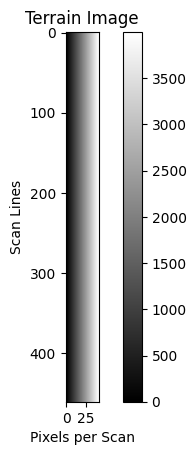

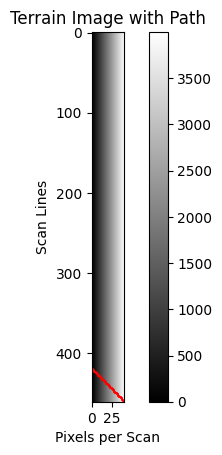

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import heapq

# Load the CSV file
data = pd.read_csv('/Users/viditparashar/Documents/Data Science Project/ch1_tmc_nca_20090510T1817389376_g_grd_d18.csv')

# Reshape the data for visualization
pixel_data = data['Pixel'].values
scan_data = data['Scan'].values

# Determine the unique scan values to understand the dimensions of the image
unique_scans = np.unique(scan_data)
num_scans = len(unique_scans)
pixels_per_scan = len(pixel_data) // num_scans

# Reshape the pixel data to a 2D array (image)
image_data = pixel_data.reshape((num_scans, pixels_per_scan))

# Plot the image
plt.imshow(image_data, cmap='gray')
plt.colorbar()
plt.title('Terrain Image')
plt.xlabel('Pixels per Scan')
plt.ylabel('Scan Lines')
plt.show()

def heuristic(a, b):
    # Use Euclidean distance as the heuristic
    return np.linalg.norm(np.array(a) - np.array(b))

def astar(array, start, goal):
    neighbors = [(0, 1), (1, 0), (0, -1), (-1, 0)]
    
    close_set = set()
    came_from = {}
    gscore = {start: 0}
    fscore = {start: heuristic(start, goal)}
    oheap = []
    
    heapq.heappush(oheap, (fscore[start], start))
    
    while oheap:
        
        current = heapq.heappop(oheap)[1]
        
        if current == goal:
            data = []
            while current in came_from:
                data.append(current)
                current = came_from[current]
            return data
        
        close_set.add(current)
        for i, j in neighbors:
            neighbor = current[0] + i, current[1] + j            
            tentative_g_score = gscore[current] + heuristic(current, neighbor)
            
            if 0 <= neighbor[0] < array.shape[0]:
                if 0 <= neighbor[1] < array.shape[1]:                
                    if neighbor in close_set:
                        continue
                    if tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                        came_from[neighbor] = current
                        gscore[neighbor] = tentative_g_score
                        fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                        heapq.heappush(oheap, (fscore[neighbor], neighbor))
                        
    return False

# Define the start and goal positions
start = (0, 0)
goal = (image_data.shape[0] - 1, image_data.shape[1] - 1)

# Find the path using A* algorithm
path = astar(image_data, start, goal)

# Visualize the path
path_x, path_y = zip(*path)

plt.imshow(image_data, cmap='gray')
plt.plot(path_y, path_x, color='red')  # Note: path_y and path_x are swapped due to row-column indexing
plt.colorbar()
plt.title('Terrain Image with Path')
plt.xlabel('Pixels per Scan')
plt.ylabel('Scan Lines')
plt.show()


In [7]:
import rasterio
from rasterio.plot import show
import numpy as np
import matplotlib.pyplot as plt

# Load the DTM file
dtm_path = 'ch2_tmc_ndn_20240226T2312096145_d_oth_d18.tif'  # Replace with your DTM file path
dtm = rasterio.open(dtm_path)

# Read the DTM data as an array
dtm_data = dtm.read(1)

# Calculate hillshade
x, y = np.gradient(dtm_data)
slope = np.pi/2.0 - np.arctan(np.sqrt(x*x + y*y))
azimuth = np.pi/4.0
hillshade = np.sin(slope) * np.cos(azimuth)

# Plot the hillshade
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(hillshade, cmap='gray')
ax.set_title('Hillshade')
plt.show()

# Plot the elevation data with color ramp
fig, ax = plt.subplots(figsize=(10, 10))
elevation = ax.imshow(dtm_data, cmap='terrain')
fig.colorbar(elevation, ax=ax, label='Elevation (meters)')
ax.set_title('Topographic Map')
plt.show()


: 

In [4]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# Load and preprocess the image
image_path = ('ch1_tmc_nca_20090510T1817389376_d_img_d18.img')
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(256, 256))
image_array = tf.keras.preprocessing.image.img_to_array(image)
image_array = np.expand_dims(image_array, axis=0)

# Define the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model on your labeled dataset (images and labels)
# model.fit(train_images, train_labels, epochs=10, batch_size=32, validation_split=0.2)

# Use the trained model to predict obstacles
predictions = model.predict(image_array)

# Analyze the predictions to plan the path


UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x311939490>

In [11]:



import numpy as np
import matplotlib.pyplot as plt
from heapq import heappop, heappush


# Load the elevation data (DTM/DEM)
elevation_data = np.load("ch2_tmc_ndn_20240226T2312096145_d_oth_d18.tif")

# Define the start and goal coordinates
start = (0, 0)  # Replace with actual coordinates
goal = (100, 100)  # Replace with actual coordinates

# Define the A* algorithm
def heuristic(a, b):
    return np.linalg.norm(np.array(a) - np.array(b))

def astar(array, start, goal):
    neighbors = [(0,1),(0,-1),(1,0),(-1,0)]
    close_set = set()
    came_from = {}
    gscore = {start:0}
    fscore = {start:heuristic(start, goal)}
    oheap = []
    heappush(oheap, (fscore[start], start))
    
    while oheap:
        current = heappop(oheap)[1]
        
        if current == goal:
            data = []
            while current in came_from:
                data.append(current)
                current = came_from[current]
            return data
        
        close_set.add(current)
        for i, j in neighbors:
            neighbor = current[0] + i, current[1] + j            
            tentative_g_score = gscore[current] + heuristic(current, neighbor)
            if 0 <= neighbor[0] < array.shape[0]:
                if 0 <= neighbor[1] < array.shape[1]:                
                    if array[neighbor[0]][neighbor[1]] == 1:
                        continue
                else:
                    continue
            else:
                continue
                
            if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                continue
                
            if  tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                came_from[neighbor] = current
                gscore[neighbor] = tentative_g_score
                fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                heappush(oheap, (fscore[neighbor], neighbor))
                
    return False

# Run the A* algorithm
path = astar(elevation_data, start, goal)

# Visualize the path
plt.imshow(elevation_data, cmap='terrain')
plt.plot([x[1] for x in path], [x[0] for x in path], color='red')
plt.scatter(start[1], start[0], color='green')
plt.scatter(goal[1], goal[0], color='blue')
plt.show()


ValueError: Cannot load file containing pickled data when allow_pickle=False

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


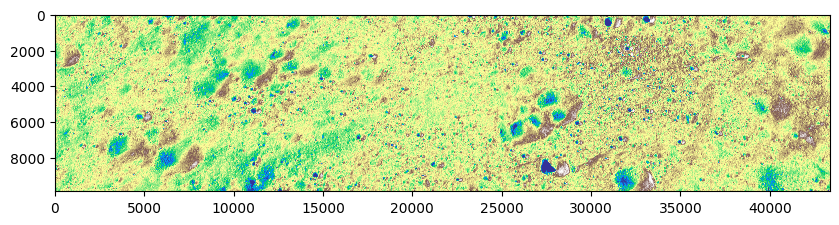

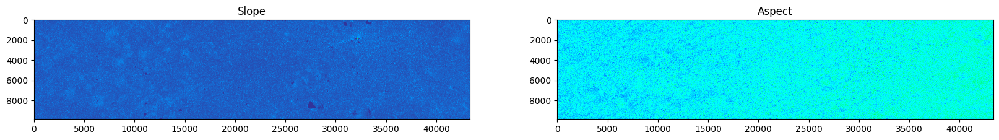

In [1]:
import rasterio
from rasterio.plot import show
import numpy as np
import matplotlib.pyplot as plt

# Load the .tif file
dtm_path = 'M1447750764_LRmos.warp.4zoom_20230901_081117.tif' 
dtm = rasterio.open(dtm_path)

# Display the file
fig, ax = plt.subplots(figsize=(10, 10))
show(dtm, ax=ax, cmap='terrain')

# Read the file data as an array
dtm_data = dtm.read(1)

# Analyze slope and aspect
x, y = np.gradient(dtm_data)
slope = np.sqrt(x**2 + y**2)
aspect = np.arctan2(-x, y)

# Plot slope and aspect
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(slope, cmap='terrain')
ax1.set_title('Slope')
ax2.imshow(aspect, cmap='hsv')
ax2.set_title('Aspect')

#show the terrain analysis
plt.show()


In [7]:
import rasterio
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.graph import route_through_array

# Load and preprocess the image
tif_path = 'M1447750764_LRmos.warp.4zoom_20230901_081117.tif'  # Replace with your .tif file path

with rasterio.open(tif_path) as dataset:
    # Read the data as a numpy array
    image_array = dataset.read(1)  # Read the first band
    image_array = np.stack([image_array] * 3, axis=-1)  # Stack to create a 3-channel image (RGB)
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension

# Resize the image to the target size if necessary
image_array_resized = tf.image.resize(image_array, [256, 256])

# Normalize the pixel values to the range [0, 1]
image_array_resized = image_array_resized / np.max(image_array_resized)

# Define the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model on your labeled dataset (images and labels)
# model.fit(train_images, train_labels, epochs=10, batch_size=32, validation_split=0.2)

# Use the trained model to predict obstacles
predictions = model.predict(image_array_resized)
predictions = np.squeeze(predictions)  # Remove batch dimension and any other unnecessary dimensions

# Threshold the predictions to create a binary obstacle map
obstacle_map = (predictions > 0.5).astype(np.uint8)

# Convert TensorFlow tensor to NumPy array for OpenCV processing
if isinstance(obstacle_map, tf.Tensor):
    obstacle_map_np = obstacle_map.numpy()
else:
    obstacle_map_np = obstacle_map

# Check the data type
print(f"Data type of obstacle_map_np: {type(obstacle_map_np)}")
print(f"Shape of obstacle_map_np: {obstacle_map_np.shape}")

# Upsample obstacle map to the original image size
obstacle_map_upsampled = cv2.resize(obstacle_map_np, (image_array.shape[2], image_array.shape[1]), interpolation=cv2.INTER_NEAREST)

# Define start and end points (example coordinates)
start_point = (10, 10)  # Replace with actual start coordinates
end_point = (image_array.shape[2] - 10, image_array.shape[1] - 10)  # Replace with actual end coordinates

# Find a safe path using a pathfinding algorithm
path, _ = route_through_array(obstacle_map_upsampled, start_point, end_point, fully_connected=True)
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(np.squeeze(image_array), cmap='gray')
ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Data type of obstacle_map_np: <class 'numpy.uint8'>
Shape of obstacle_map_np: ()


error: OpenCV(4.9.0) :-1: error: (-5:Bad argument) in function 'resize'
> Overload resolution failed:
>  - src is not a numpy array, neither a scalar
>  - Expected Ptr<cv::UMat> for argument 'src'


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Data type of obstacle_map_np: <class 'numpy.ndarray'>
Shape of obstacle_map_np: ()


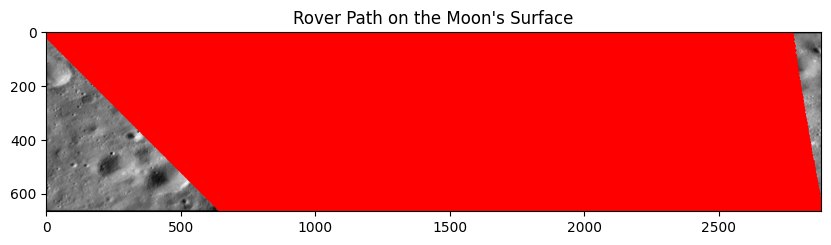

In [12]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.graph import route_through_array
from PIL import Image

# Load the screenshot image
image_path = 'photo.png'
image = Image.open(image_path).convert('RGB')  # Convert to RGB to ensure 3 channels
image_array = np.array(image)

# Resize the image to the target size if necessary
image_array_resized = tf.image.resize(image_array, [256, 256])

# Normalize the pixel values to the range [0, 1]
image_array_resized = image_array_resized / 255.0

# Define the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Assuming you have a trained model, load the weights (skip if you need to train the model first)
# model.load_weights('path_to_trained_model_weights.h5')

# Use the trained model to predict obstacles
image_array_resized_batch = np.expand_dims(image_array_resized, axis=0)  # Add batch dimension
predictions = model.predict(image_array_resized_batch)
predictions = np.squeeze(predictions)  # Remove batch dimension and any other unnecessary dimensions

# Threshold the predictions to create a binary obstacle map
obstacle_map = (predictions > 0.5).astype(np.uint8)

# Ensure obstacle_map is a NumPy array
if isinstance(obstacle_map, tf.Tensor):
    obstacle_map_np = obstacle_map.numpy()
else:
    obstacle_map_np = np.array(obstacle_map)

# Check the data type
print(f"Data type of obstacle_map_np: {type(obstacle_map_np)}")
print(f"Shape of obstacle_map_np: {obstacle_map_np.shape}")

# Upsample obstacle map to the original image size
obstacle_map_upsampled = cv2.resize(obstacle_map_np, (image_array.shape[1], image_array.shape[0]), interpolation=cv2.INTER_NEAREST)

# Define start and end points (ensure they are within the bounds)
start_point = (10, 10)  # Replace with actual start coordinates
end_point = (image_array.shape[1] - 20, image_array.shape[0] - 20)  # Replace with actual end coordinates

# Ensure start and end points are within the bounds of the upsampled map
start_point = (min(start_point[0], obstacle_map_upsampled.shape[0] - 1), min(start_point[1], obstacle_map_upsampled.shape[1] - 1))
end_point = (min(end_point[0], obstacle_map_upsampled.shape[0] - 1), min(end_point[1], obstacle_map_upsampled.shape[1] - 1))

# Find a safe path using a pathfinding algorithm
path, _ = route_through_array(obstacle_map_upsampled, start_point, end_point, fully_connected=True)
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_array, cmap='gray')
ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Data type of obstacle_map_np: <class 'numpy.ndarray'>
Shape of obstacle_map_np: ()


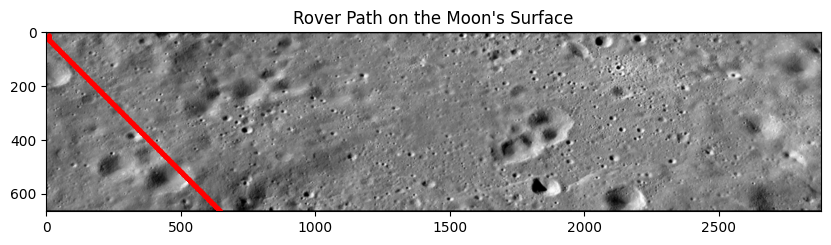

In [13]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from scipy.spatial import distance
from heapq import heappop, heappush

# Load the screenshot image
image_path = 'photo.png'
image = Image.open(image_path).convert('RGB')  # Convert to RGB to ensure 3 channels
image_array = np.array(image)

# Resize the image to the target size if necessary
image_array_resized = tf.image.resize(image_array, [256, 256])

# Normalize the pixel values to the range [0, 1]
image_array_resized = image_array_resized / 255.0

# Define the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Assuming you have a trained model, load the weights (skip if you need to train the model first)
# model.load_weights('path_to_trained_model_weights.h5')

# Use the trained model to predict obstacles
image_array_resized_batch = np.expand_dims(image_array_resized, axis=0)  # Add batch dimension
predictions = model.predict(image_array_resized_batch)
predictions = np.squeeze(predictions)  # Remove batch dimension and any other unnecessary dimensions

# Threshold the predictions to create a binary obstacle map
obstacle_map = (predictions > 0.5).astype(np.uint8)

# Ensure obstacle_map is a NumPy array
if isinstance(obstacle_map, tf.Tensor):
    obstacle_map_np = obstacle_map.numpy()
else:
    obstacle_map_np = np.array(obstacle_map)

# Check the data type
print(f"Data type of obstacle_map_np: {type(obstacle_map_np)}")
print(f"Shape of obstacle_map_np: {obstacle_map_np.shape}")

# Upsample obstacle map to the original image size
obstacle_map_upsampled = cv2.resize(obstacle_map_np, (image_array.shape[1], image_array.shape[0]), interpolation=cv2.INTER_NEAREST)

# Define start and end points (ensure they are within the bounds)
start_point = (10, 10)  # Replace with actual start coordinates
end_point = (image_array.shape[1] - 20, image_array.shape[0] - 20)  # Replace with actual end coordinates

# Ensure start and end points are within the bounds of the upsampled map
start_point = (min(start_point[0], obstacle_map_upsampled.shape[0] - 1), min(start_point[1], obstacle_map_upsampled.shape[1] - 1))
end_point = (min(end_point[0], obstacle_map_upsampled.shape[0] - 1), min(end_point[1], obstacle_map_upsampled.shape[1] - 1))

def heuristic(a, b):
    return distance.euclidean(a, b)

def astar(array, start, goal):
    neighbors = [(0, 1), (0, -1), (1, 0), (-1, 0)]

    close_set = set()
    came_from = {}
    gscore = {start: 0}
    fscore = {start: heuristic(start, goal)}
    oheap = []

    heappush(oheap, (fscore[start], start))
    
    while oheap:
        current = heappop(oheap)[1]
        
        if current == goal:
            data = []
            while current in came_from:
                data.append(current)
                current = came_from[current]
            return data
        
        close_set.add(current)
        for i, j in neighbors:
            neighbor = current[0] + i, current[1] + j            
            tentative_g_score = gscore[current] + heuristic(current, neighbor)
            
            if 0 <= neighbor[0] < array.shape[0]:
                if 0 <= neighbor[1] < array.shape[1]:                
                    if array[neighbor[0]][neighbor[1]] == 1:
                        continue
                else:
                    # array bound y walls
                    continue
            else:
                # array bound x walls
                continue
                
            if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                continue
                
            if tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                came_from[neighbor] = current
                gscore[neighbor] = tentative_g_score
                fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                heappush(oheap, (fscore[neighbor], neighbor))
    
    return False

# Find a safe path using the A* algorithm
path = astar(obstacle_map_upsampled, start_point, end_point)
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_array, cmap='gray')
ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()


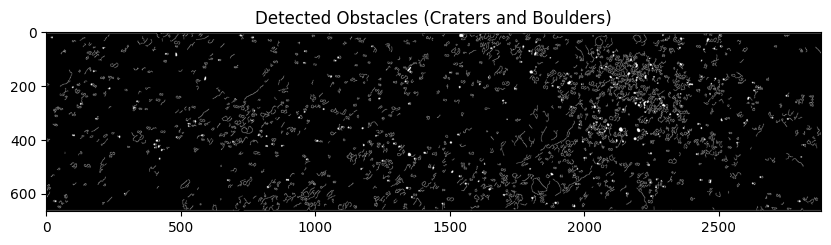

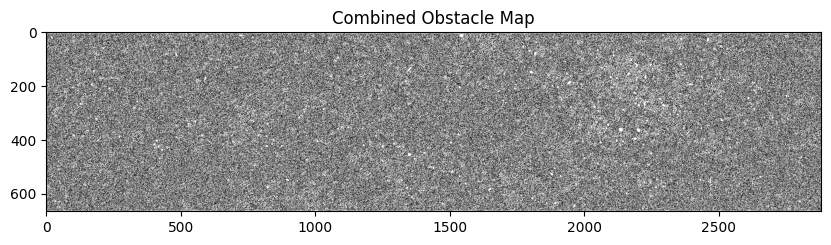

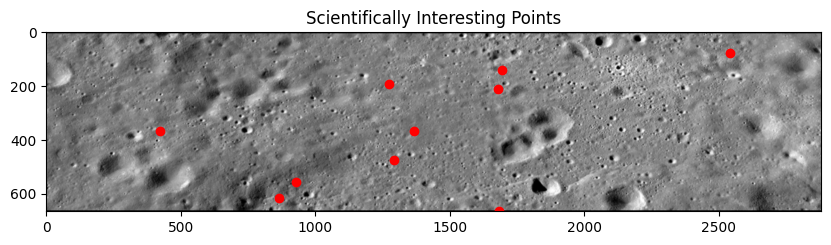

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

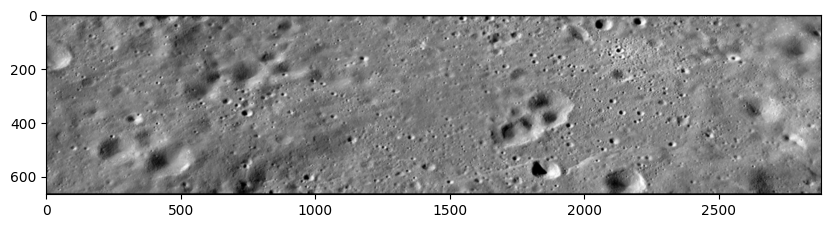

In [15]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image
image_path = 'photo.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

# Use Canny Edge Detection
edges = cv2.Canny(blurred_image, 50, 150)

# Find contours
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an empty obstacle map
obstacle_map = np.zeros_like(image)

# Draw contours on the obstacle map
for contour in contours:
    cv2.drawContours(obstacle_map, [contour], -1, (255), thickness=cv2.FILLED)

# Threshold the obstacle map to create a binary map
_, obstacle_map_binary = cv2.threshold(obstacle_map, 127, 1, cv2.THRESH_BINARY)

# Visualize the detected obstacles
plt.figure(figsize=(10, 10))
plt.imshow(obstacle_map_binary, cmap='gray')
plt.title('Detected Obstacles (Craters and Boulders)')
plt.show()



# Load the CNN-generated obstacle map (assuming it's stored in obstacle_map_cnn)
# For the sake of this example, we'll create a dummy obstacle map
obstacle_map_cnn = np.random.randint(0, 2, size=image.shape, dtype=np.uint8)

# Combine the obstacle maps
combined_obstacle_map = np.maximum(obstacle_map_binary, obstacle_map_cnn)

# Visualize the combined obstacle map
plt.figure(figsize=(10, 10))
plt.imshow(combined_obstacle_map, cmap='gray')
plt.title('Combined Obstacle Map')
plt.show()



import random

def find_scientifically_interesting_points(image, num_points=10):
    points = []
    for _ in range(num_points):
        x = random.randint(0, image.shape[1] - 1)
        y = random.randint(0, image.shape[0] - 1)
        points.append((x, y))
    return points

interesting_points = find_scientifically_interesting_points(image, num_points=10)

# Visualize the scientifically interesting points
plt.figure(figsize=(10, 10))
plt.imshow(image, cmap='gray')
for point in interesting_points:
    plt.plot(point[0], point[1], 'ro')
plt.title('Scientifically Interesting Points')
plt.show()


def heuristic(a, b):
    return distance.euclidean(a, b)

def astar_with_stops(array, start, goals):
    neighbors = [(0, 1), (0, -1), (1, 0), (-1, 0)]
    path = []
    current = start
    
    for goal in goals:
        close_set = set()
        came_from = {}
        gscore = {current: 0}
        fscore = {current: heuristic(current, goal)}
        oheap = []

        heappush(oheap, (fscore[current], current))
        
        while oheap:
            current = heappop(oheap)[1]
            
            if current == goal:
                while current in came_from:
                    path.append(current)
                    current = came_from[current]
                path.append(goal)
                break
            
            close_set.add(current)
            for i, j in neighbors:
                neighbor = current[0] + i, current[1] + j            
                tentative_g_score = gscore[current] + heuristic(current, neighbor)
                
                if 0 <= neighbor[0] < array.shape[0]:
                    if 0 <= neighbor[1] < array.shape[1]:                
                        if array[neighbor[0]][neighbor[1]] == 1:
                            continue
                    else:
                        # array bound y walls
                        continue
                else:
                    # array bound x walls
                    continue
                    
                if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                    continue
                    
                if tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                    came_from[neighbor] = current
                    gscore[neighbor] = tentative_g_score
                    fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                    heappush(oheap, (fscore[neighbor], neighbor))
    
    return path

# Define start and end points
start_point = (10, 10)
end_point = (image.shape[1] - 20, image.shape[0] - 20)

# Ensure start and end points are within the bounds of the obstacle map
start_point = (min(start_point[0], combined_obstacle_map.shape[0] - 1), min(start_point[1], combined_obstacle_map.shape[1] - 1))
end_point = (min(end_point[0], combined_obstacle_map.shape[0] - 1), min(end_point[1], combined_obstacle_map.shape[1] - 1))

# Find a safe path using the A* algorithm with stops
path = astar_with_stops(combined_obstacle_map, start_point, interesting_points + [end_point])
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image, cmap='gray')
ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
for point in interesting_points:
    ax.plot(point[0], point[1], 'bo')  # Mark scientifically interesting points in blue
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()


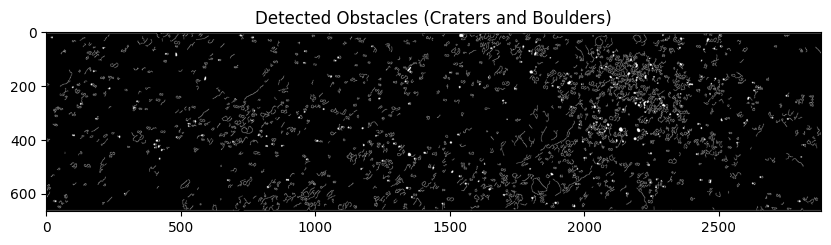

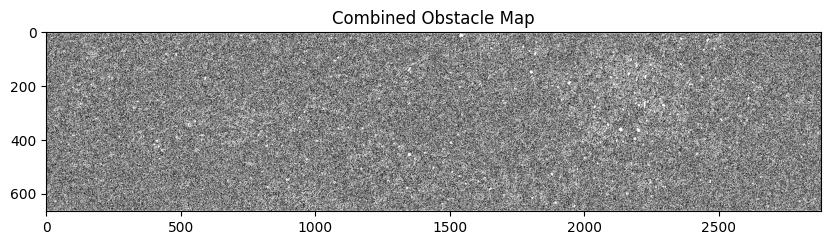

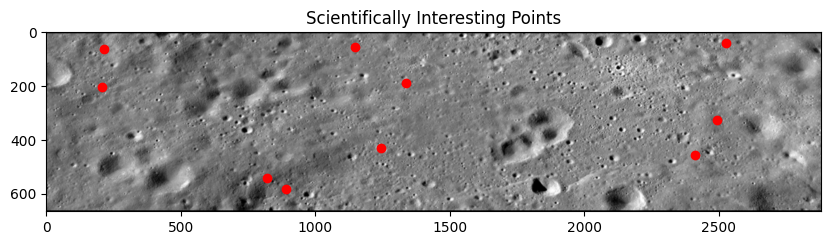

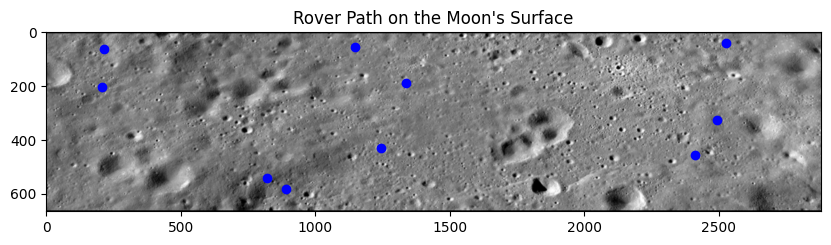

In [16]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.spatial import distance
from heapq import heappop, heappush
import random

# Load the image
image_path = 'photo.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

# Use Canny Edge Detection
edges = cv2.Canny(blurred_image, 50, 150)

# Find contours
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an empty obstacle map
obstacle_map = np.zeros_like(image)

# Draw contours on the obstacle map
for contour in contours:
    cv2.drawContours(obstacle_map, [contour], -1, (255), thickness=cv2.FILLED)

# Threshold the obstacle map to create a binary map
_, obstacle_map_binary = cv2.threshold(obstacle_map, 127, 1, cv2.THRESH_BINARY)

# Visualize the detected obstacles
plt.figure(figsize=(10, 10))
plt.imshow(obstacle_map_binary, cmap='gray')
plt.title('Detected Obstacles (Craters and Boulders)')
plt.show()

# Dummy obstacle map from CNN (replace with actual CNN output)
obstacle_map_cnn = np.random.randint(0, 2, size=image.shape, dtype=np.uint8)

# Combine the obstacle maps
combined_obstacle_map = np.maximum(obstacle_map_binary, obstacle_map_cnn)

# Visualize the combined obstacle map
plt.figure(figsize=(10, 10))
plt.imshow(combined_obstacle_map, cmap='gray')
plt.title('Combined Obstacle Map')
plt.show()

# Function to find scientifically interesting points
def find_scientifically_interesting_points(image, num_points=10):
    points = []
    for _ in range(num_points):
        x = random.randint(0, image.shape[1] - 1)
        y = random.randint(0, image.shape[0] - 1)
        points.append((y, x))  # Note the (y, x) order
    return points

interesting_points = find_scientifically_interesting_points(image, num_points=10)

# Visualize the scientifically interesting points
plt.figure(figsize=(10, 10))
plt.imshow(image, cmap='gray')
for point in interesting_points:
    plt.plot(point[1], point[0], 'ro')  # Note the (x, y) order
plt.title('Scientifically Interesting Points')
plt.show()

# A* Algorithm with Stops
def heuristic(a, b):
    return distance.euclidean(a, b)

def astar_with_stops(array, start, goals):
    neighbors = [(0, 1), (0, -1), (1, 0), (-1, 0)]
    path = []
    current = start
    
    for goal in goals:
        close_set = set()
        came_from = {}
        gscore = {current: 0}
        fscore = {current: heuristic(current, goal)}
        oheap = []

        heappush(oheap, (fscore[current], current))
        
        while oheap:
            current = heappop(oheap)[1]
            
            if current == goal:
                temp_path = []
                while current in came_from:
                    temp_path.append(current)
                    current = came_from[current]
                path.extend(temp_path[::-1])
                path.append(goal)
                break
            
            close_set.add(current)
            for i, j in neighbors:
                neighbor = current[0] + i, current[1] + j            
                tentative_g_score = gscore[current] + heuristic(current, neighbor)
                
                if 0 <= neighbor[0] < array.shape[0]:
                    if 0 <= neighbor[1] < array.shape[1]:                
                        if array[neighbor[0]][neighbor[1]] == 1:
                            continue
                    else:
                        # array bound y walls
                        continue
                else:
                    # array bound x walls
                    continue
                    
                if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                    continue
                    
                if tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                    came_from[neighbor] = current
                    gscore[neighbor] = tentative_g_score
                    fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                    heappush(oheap, (fscore[neighbor], neighbor))
    
    return path

# Define start and end points
start_point = (10, 10)
end_point = (image.shape[0] - 20, image.shape[1] - 20)

# Ensure start and end points are within the bounds of the obstacle map
start_point = (min(start_point[0], combined_obstacle_map.shape[0] - 1), min(start_point[1], combined_obstacle_map.shape[1] - 1))
end_point = (min(end_point[0], combined_obstacle_map.shape[0] - 1), min(end_point[1], combined_obstacle_map.shape[1] - 1))

# Find a safe path using the A* algorithm with stops
goals = interesting_points + [end_point]
path = astar_with_stops(combined_obstacle_map, start_point, goals)

# Convert path to numpy array for visualization
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image, cmap='gray')
if path.size > 0:
    ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
for point in interesting_points:
    ax.plot(point[1], point[0], 'bo')  # Mark scientifically interesting points in blue
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()


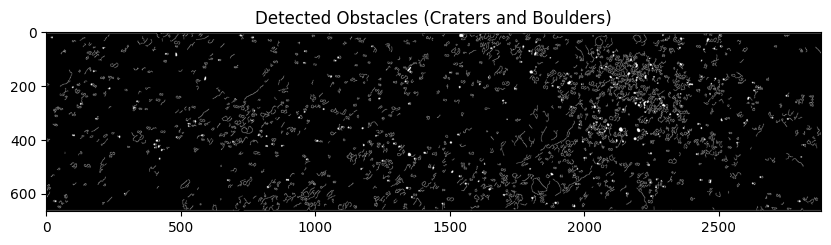

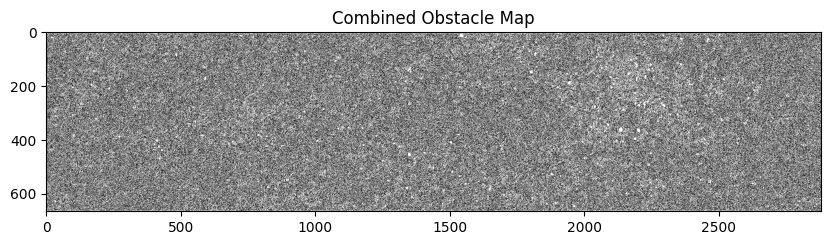

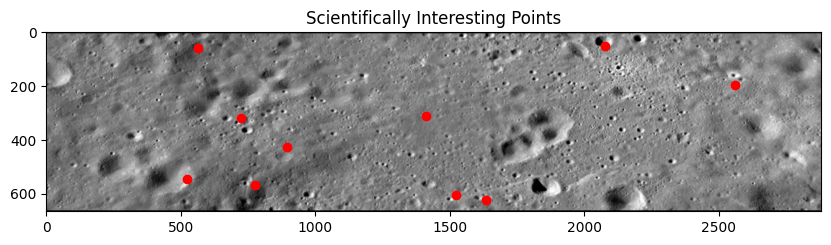

Could not find a path to (312, 1411)


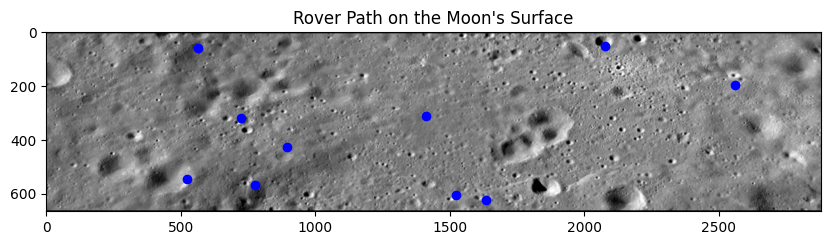

In [17]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.spatial import distance
from heapq import heappop, heappush
import random

# Load the image
image_path = 'photo.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

# Use Canny Edge Detection
edges = cv2.Canny(blurred_image, 50, 150)

# Find contours
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an empty obstacle map
obstacle_map = np.zeros_like(image)

# Draw contours on the obstacle map
for contour in contours:
    cv2.drawContours(obstacle_map, [contour], -1, (255), thickness=cv2.FILLED)

# Threshold the obstacle map to create a binary map
_, obstacle_map_binary = cv2.threshold(obstacle_map, 127, 1, cv2.THRESH_BINARY)

# Visualize the detected obstacles
plt.figure(figsize=(10, 10))
plt.imshow(obstacle_map_binary, cmap='gray')
plt.title('Detected Obstacles (Craters and Boulders)')
plt.show()

# Dummy obstacle map from CNN (replace with actual CNN output)
obstacle_map_cnn = np.random.randint(0, 2, size=image.shape, dtype=np.uint8)

# Combine the obstacle maps
combined_obstacle_map = np.maximum(obstacle_map_binary, obstacle_map_cnn)

# Visualize the combined obstacle map
plt.figure(figsize=(10, 10))
plt.imshow(combined_obstacle_map, cmap='gray')
plt.title('Combined Obstacle Map')
plt.show()

# Function to find scientifically interesting points
def find_scientifically_interesting_points(image, num_points=10):
    points = []
    for _ in range(num_points):
        x = random.randint(0, image.shape[1] - 1)
        y = random.randint(0, image.shape[0] - 1)
        points.append((y, x))  # Note the (y, x) order
    return points

interesting_points = find_scientifically_interesting_points(image, num_points=10)

# Visualize the scientifically interesting points
plt.figure(figsize=(10, 10))
plt.imshow(image, cmap='gray')
for point in interesting_points:
    plt.plot(point[1], point[0], 'ro')  # Note the (x, y) order
plt.title('Scientifically Interesting Points')
plt.show()

# A* Algorithm with Stops
def heuristic(a, b):
    return distance.euclidean(a, b)

def astar(array, start, goal):
    neighbors = [(0, 1), (0, -1), (1, 0), (-1, 0)]
    close_set = set()
    came_from = {}
    gscore = {start: 0}
    fscore = {start: heuristic(start, goal)}
    oheap = []
    
    heappush(oheap, (fscore[start], start))
    
    while oheap:
        current = heappop(oheap)[1]
        
        if current == goal:
            data = []
            while current in came_from:
                data.append(current)
                current = came_from[current]
            return data[::-1]
        
        close_set.add(current)
        for i, j in neighbors:
            neighbor = current[0] + i, current[1] + j            
            tentative_g_score = gscore[current] + heuristic(current, neighbor)
            
            if 0 <= neighbor[0] < array.shape[0]:
                if 0 <= neighbor[1] < array.shape[1]:                
                    if array[neighbor[0]][neighbor[1]] == 1:
                        continue
                else:
                    # array bound y walls
                    continue
            else:
                # array bound x walls
                continue
                
            if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                continue
                
            if tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                came_from[neighbor] = current
                gscore[neighbor] = tentative_g_score
                fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                heappush(oheap, (fscore[neighbor], neighbor))
    
    return []

def astar_with_stops(array, start, stops):
    path = []
    current_start = start
    
    for stop in stops:
        segment = astar(array, current_start, stop)
        if segment:
            path.extend(segment)
            current_start = stop
        else:
            print(f"Could not find a path to {stop}")
            break
    
    return path

# Define start and end points
start_point = (10, 10)
end_point = (image.shape[0] - 20, image.shape[1] - 20)

# Ensure start and end points are within the bounds of the obstacle map
start_point = (min(start_point[0], combined_obstacle_map.shape[0] - 1), min(start_point[1], combined_obstacle_map.shape[1] - 1))
end_point = (min(end_point[0], combined_obstacle_map.shape[0] - 1), min(end_point[1], combined_obstacle_map.shape[1] - 1))

# Find a safe path using the A* algorithm with stops
goals = interesting_points + [end_point]
path = astar_with_stops(combined_obstacle_map, start_point, goals)

# Convert path to numpy array for visualization
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image, cmap='gray')
if path.size > 0:
    ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
for point in interesting_points:
    ax.plot(point[1], point[0], 'bo')  # Mark scientifically interesting points in blue
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()


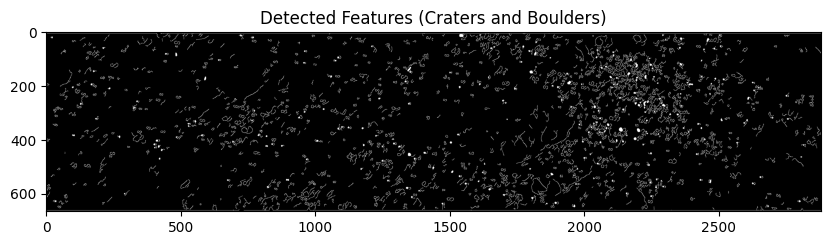

In [19]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the lunar surface image
image_path = 'photo.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

# Use Canny Edge Detection to identify edges
edges = cv2.Canny(blurred_image, 50, 150)

# Find contours to identify shapes
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an empty obstacle map
obstacle_map = np.zeros_like(image)

# Draw contours on the obstacle map
for contour in contours:
    cv2.drawContours(obstacle_map, [contour], -1, (255), thickness=cv2.FILLED)

# Visualize the detected features
plt.figure(figsize=(10, 10))
plt.imshow(obstacle_map, cmap='gray')
plt.title('Detected Features (Craters and Boulders)')
plt.show()


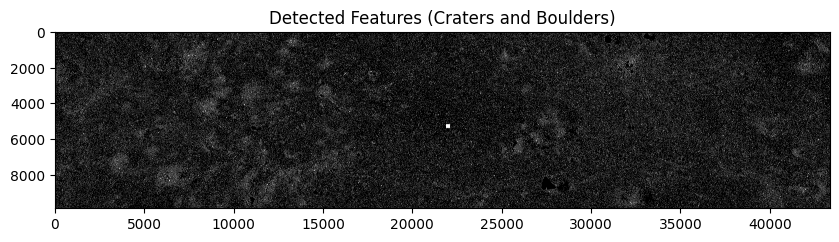

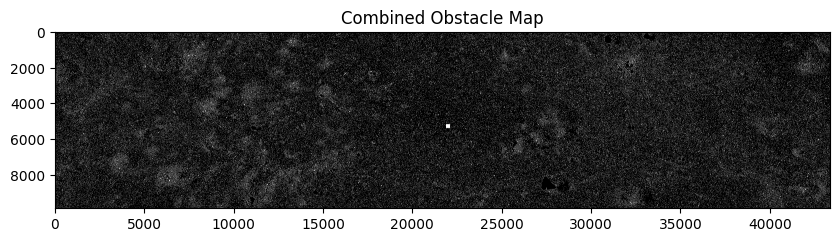

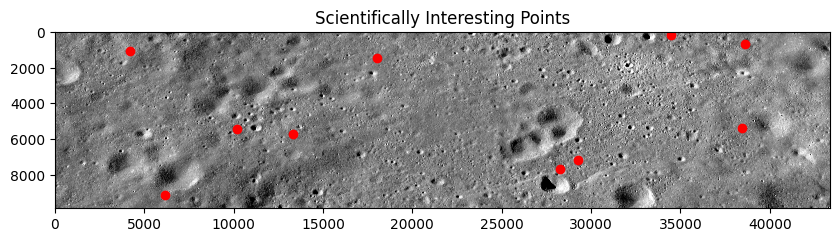

Could not find a path to (162, 34474)


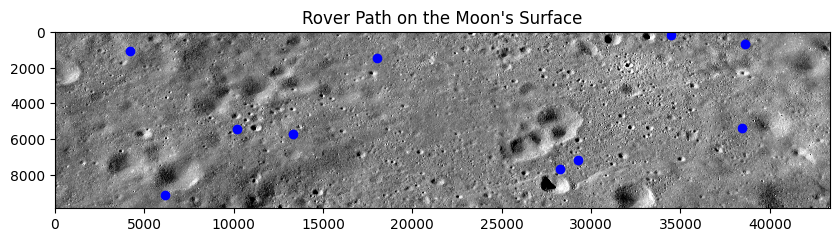

In [20]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.spatial import distance
from heapq import heappop, heappush
import random
import tifffile as tiff

# Load the lunar surface image in .tif format
image_path = 'lunar.tif'
image = tiff.imread(image_path)

# Convert the image to grayscale if it's not already
if len(image.shape) == 3:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

# Use Canny Edge Detection to identify edges
edges = cv2.Canny(blurred_image, 50, 150)

# Find contours to identify shapes
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an empty obstacle map
obstacle_map = np.zeros_like(image)

# Draw contours on the obstacle map
for contour in contours:
    cv2.drawContours(obstacle_map, [contour], -1, (255), thickness=cv2.FILLED)

# Visualize the detected features
plt.figure(figsize=(10, 10))
plt.imshow(obstacle_map, cmap='gray')
plt.title('Detected Features (Craters and Boulders)')
plt.show()

# Dummy obstacle map from CNN (replace with actual CNN output)
obstacle_map_cnn = np.random.randint(0, 2, size=image.shape, dtype=np.uint8)

# Combine the obstacle maps
combined_obstacle_map = np.maximum(obstacle_map, obstacle_map_cnn)

# Visualize the combined obstacle map
plt.figure(figsize=(10, 10))
plt.imshow(combined_obstacle_map, cmap='gray')
plt.title('Combined Obstacle Map')
plt.show()

# Function to find scientifically interesting points
def find_scientifically_interesting_points(image, num_points=10):
    points = []
    for _ in range(num_points):
        x = random.randint(0, image.shape[1] - 1)
        y = random.randint(0, image.shape[0] - 1)
        points.append((y, x))  # Note the (y, x) order
    return points

interesting_points = find_scientifically_interesting_points(image, num_points=10)

# Visualize the scientifically interesting points
plt.figure(figsize=(10, 10))
plt.imshow(image, cmap='gray')
for point in interesting_points:
    plt.plot(point[1], point[0], 'ro')  # Note the (x, y) order
plt.title('Scientifically Interesting Points')
plt.show()

# A* Algorithm with Stops
def heuristic(a, b):
    return distance.euclidean(a, b)

def astar(array, start, goal):
    neighbors = [(0, 1), (0, -1), (1, 0), (-1, 0)]
    close_set = set()
    came_from = {}
    gscore = {start: 0}
    fscore = {start: heuristic(start, goal)}
    oheap = []
    
    heappush(oheap, (fscore[start], start))
    
    while oheap:
        current = heappop(oheap)[1]
        
        if current == goal:
            data = []
            while current in came_from:
                data.append(current)
                current = came_from[current]
            return data[::-1]
        
        close_set.add(current)
        for i, j in neighbors:
            neighbor = current[0] + i, current[1] + j            
            tentative_g_score = gscore[current] + heuristic(current, neighbor)
            
            if 0 <= neighbor[0] < array.shape[0]:
                if 0 <= neighbor[1] < array.shape[1]:                
                    if array[neighbor[0]][neighbor[1]] == 1:
                        continue
                else:
                    # array bound y walls
                    continue
            else:
                # array bound x walls
                continue
                
            if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                continue
                
            if tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                came_from[neighbor] = current
                gscore[neighbor] = tentative_g_score
                fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                heappush(oheap, (fscore[neighbor], neighbor))
    
    return []

def astar_with_stops(array, start, stops):
    path = []
    current_start = start
    
    for stop in stops:
        segment = astar(array, current_start, stop)
        if segment:
            path.extend(segment)
            current_start = stop
        else:
            print(f"Could not find a path to {stop}")
            break
    
    return path

# Define start and end points
start_point = (10, 10)
end_point = (image.shape[0] - 20, image.shape[1] - 20)

# Ensure start and end points are within the bounds of the obstacle map
start_point = (min(start_point[0], combined_obstacle_map.shape[0] - 1), min(start_point[1], combined_obstacle_map.shape[1] - 1))
end_point = (min(end_point[0], combined_obstacle_map.shape[0] - 1), min(end_point[1], combined_obstacle_map.shape[1] - 1))

# Find a safe path using the A* algorithm with stops
goals = interesting_points + [end_point]
path = astar_with_stops(combined_obstacle_map, start_point, goals)

# Convert path to numpy array for visualization
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image, cmap='gray')
if path.size > 0:
    ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
for point in interesting_points:
    ax.plot(point[1], point[0], 'bo')  # Mark scientifically interesting points in blue
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()


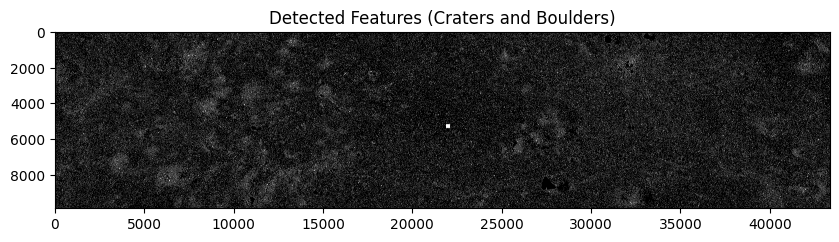

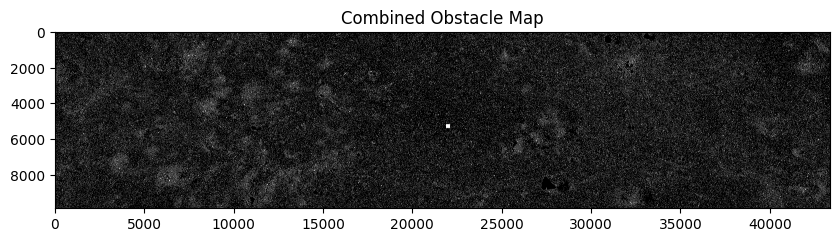

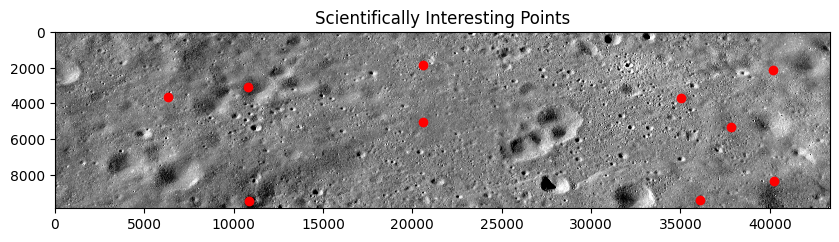

Could not find a path to (3083, 10827)


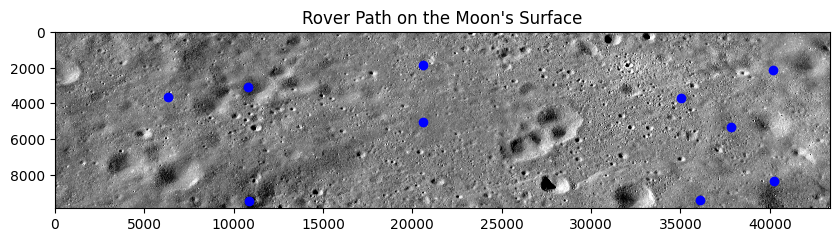

In [24]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.spatial import distance
from heapq import heappop, heappush
import random
from tifffile import imread

# Load the lunar surface image in .tif format
image_path = 'lunar.tif'
image = imread(image_path)
image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

# Load the DEM file (in PNG format)
dem_path = 'output.png'
dem_image = cv2.imread(dem_path, cv2.IMREAD_GRAYSCALE)

# Ensure the DEM image matches the size of the lunar surface image
elevation_resized = cv2.resize(dem_image, (image.shape[1], image.shape[0]))
elevation_normalized = (elevation_resized - np.min(elevation_resized)) / (np.max(elevation_resized) - np.min(elevation_resized))

# Apply Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

# Use Canny Edge Detection to identify edges
edges = cv2.Canny(blurred_image, 50, 150)

# Find contours to identify shapes
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an empty obstacle map
obstacle_map = np.zeros_like(image)

# Draw contours on the obstacle map
for contour in contours:
    cv2.drawContours(obstacle_map, [contour], -1, (255), thickness=cv2.FILLED)

# Visualize the detected features
plt.figure(figsize=(10, 10))
plt.imshow(obstacle_map, cmap='gray')
plt.title('Detected Features (Craters and Boulders)')
plt.show()

# Dummy obstacle map from CNN (replace with actual CNN output)
obstacle_map_cnn = np.random.randint(0, 2, size=image.shape, dtype=np.uint8)

# Combine the obstacle maps
combined_obstacle_map = np.maximum(obstacle_map, obstacle_map_cnn)

# Visualize the combined obstacle map
plt.figure(figsize=(10, 10))
plt.imshow(combined_obstacle_map, cmap='gray')
plt.title('Combined Obstacle Map')
plt.show()

# Function to find scientifically interesting points
def find_scientifically_interesting_points(image, num_points=10):
    points = []
    for _ in range(num_points):
        x = random.randint(0, image.shape[1] - 1)
        y = random.randint(0, image.shape[0] - 1)
        points.append((y, x))  # Note the (y, x) order
    return points

interesting_points = find_scientifically_interesting_points(image, num_points=10)

# Visualize the scientifically interesting points
plt.figure(figsize=(10, 10))
plt.imshow(image, cmap='gray')
for point in interesting_points:
    plt.plot(point[1], point[0], 'ro')  # Note the (x, y) order
plt.title('Scientifically Interesting Points')
plt.show()

# A* Algorithm with Stops
def heuristic(a, b):
    return distance.euclidean(a, b)

def astar(array, start, goal, elevation_map):
    neighbors = [(0, 1), (0, -1), (1, 0), (-1, 0)]
    close_set = set()
    came_from = {}
    gscore = {start: 0}
    fscore = {start: heuristic(start, goal)}
    oheap = []
    
    heappush(oheap, (fscore[start], start))
    
    while oheap:
        current = heappop(oheap)[1]
        
        if current == goal:
            data = []
            while current in came_from:
                data.append(current)
                current = came_from[current]
            return data[::-1]
        
        close_set.add(current)
        for i, j in neighbors:
            neighbor = current[0] + i, current[1] + j            
            tentative_g_score = gscore[current] + heuristic(current, neighbor) + elevation_map[neighbor[0], neighbor[1]]
            
            if 0 <= neighbor[0] < array.shape[0]:
                if 0 <= neighbor[1] < array.shape[1]:                
                    if array[neighbor[0]][neighbor[1]] == 1:
                        continue
                else:
                    # array bound y walls
                    continue
            else:
                # array bound x walls
                continue
                
            if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                continue
                
            if tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                came_from[neighbor] = current
                gscore[neighbor] = tentative_g_score
                fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                heappush(oheap, (fscore[neighbor], neighbor))
    
    return []

def astar_with_stops(array, start, stops, elevation_map):
    path = []
    current_start = start
    
    for stop in stops:
        segment = astar(array, current_start, stop, elevation_map)
        if segment:
            path.extend(segment)
            current_start = stop
        else:
            print(f"Could not find a path to {stop}")
            break
    
    return path

# Define start and end points
start_point = (10, 10)
end_point = (image.shape[0] - 20, image.shape[1] - 20)

# Ensure start and end points are within the bounds of the obstacle map
start_point = (min(start_point[0], combined_obstacle_map.shape[0] - 1), min(start_point[1], combined_obstacle_map.shape[1] - 1))
end_point = (min(end_point[0], combined_obstacle_map.shape[0] - 1), min(end_point[1], combined_obstacle_map.shape[1] - 1))

# Find a safe path using the A* algorithm with stops
goals = interesting_points + [end_point]
path = astar_with_stops(combined_obstacle_map, start_point, goals, elevation_normalized)

# Convert path to numpy array for visualization
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image, cmap='gray')
if path.size > 0:
    ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
for point in interesting_points:
    ax.plot(point[1], point[0], 'bo')  # Mark scientifically interesting points in blue
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()


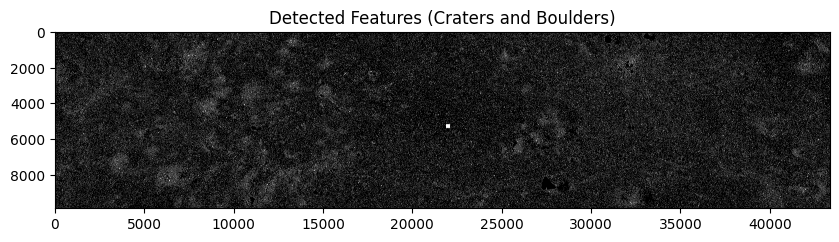

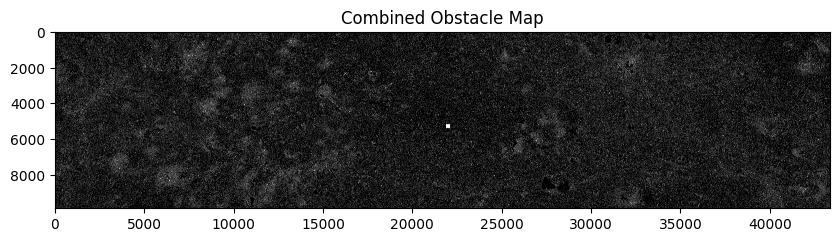

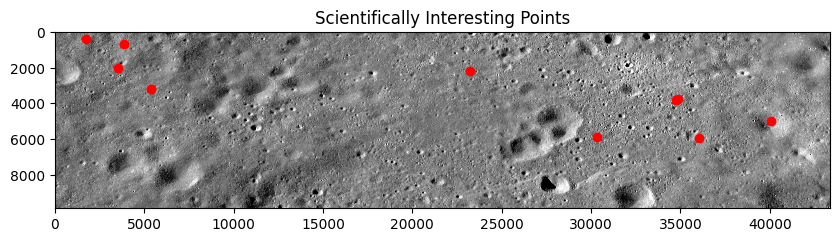

Could not find a path to (2168, 23214)


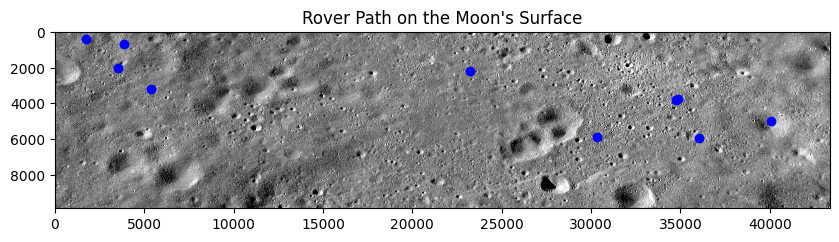

In [25]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.spatial import distance
from heapq import heappop, heappush
import random
from tifffile import imread

# Load the lunar surface image in .tif format
image_path = 'lunar.tif'
image = imread(image_path)
image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

# Load the DEM file (in PNG format)
dem_path = 'output.png'
dem_image = cv2.imread(dem_path, cv2.IMREAD_GRAYSCALE)

# Ensure the DEM image matches the size of the lunar surface image
elevation_resized = cv2.resize(dem_image, (image.shape[1], image.shape[0]))
elevation_normalized = (elevation_resized - np.min(elevation_resized)) / (np.max(elevation_resized) - np.min(elevation_resized))

# Apply Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

# Use Canny Edge Detection to identify edges
edges = cv2.Canny(blurred_image, 50, 150)

# Find contours to identify shapes
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an empty obstacle map
obstacle_map = np.zeros_like(image)

# Draw contours on the obstacle map
for contour in contours:
    cv2.drawContours(obstacle_map, [contour], -1, (255), thickness=cv2.FILLED)

# Visualize the detected features
plt.figure(figsize=(10, 10))
plt.imshow(obstacle_map, cmap='gray')
plt.title('Detected Features (Craters and Boulders)')
plt.show()

# Dummy obstacle map from CNN (replace with actual CNN output)
obstacle_map_cnn = np.random.randint(0, 2, size=image.shape, dtype=np.uint8)

# Combine the obstacle maps
combined_obstacle_map = np.maximum(obstacle_map, obstacle_map_cnn)

# Visualize the combined obstacle map
plt.figure(figsize=(10, 10))
plt.imshow(combined_obstacle_map, cmap='gray')
plt.title('Combined Obstacle Map')
plt.show()

# Function to find scientifically interesting points
def find_scientifically_interesting_points(image, num_points=10):
    points = []
    for _ in range(num_points):
        while True:
            x = random.randint(0, image.shape[1] - 1)
            y = random.randint(0, image.shape[0] - 1)
            if combined_obstacle_map[y, x] == 0:  # Ensure the point is not in an obstacle
                points.append((y, x))  # Note the (y, x) order
                break
    return points

interesting_points = find_scientifically_interesting_points(image, num_points=10)

# Visualize the scientifically interesting points
plt.figure(figsize=(10, 10))
plt.imshow(image, cmap='gray')
for point in interesting_points:
    plt.plot(point[1], point[0], 'ro')  # Note the (x, y) order
plt.title('Scientifically Interesting Points')
plt.show()

# A* Algorithm with Stops
def heuristic(a, b):
    return distance.euclidean(a, b)

def astar(array, start, goal, elevation_map):
    neighbors = [(0, 1), (0, -1), (1, 0), (-1, 0)]
    close_set = set()
    came_from = {}
    gscore = {start: 0}
    fscore = {start: heuristic(start, goal)}
    oheap = []
    
    heappush(oheap, (fscore[start], start))
    
    while oheap:
        current = heappop(oheap)[1]
        
        if current == goal:
            data = []
            while current in came_from:
                data.append(current)
                current = came_from[current]
            return data[::-1]
        
        close_set.add(current)
        for i, j in neighbors:
            neighbor = current[0] + i, current[1] + j            
            tentative_g_score = gscore[current] + heuristic(current, neighbor) + elevation_map[neighbor[0], neighbor[1]]
            
            if 0 <= neighbor[0] < array.shape[0]:
                if 0 <= neighbor[1] < array.shape[1]:                
                    if array[neighbor[0]][neighbor[1]] == 1:
                        continue
                else:
                    # array bound y walls
                    continue
            else:
                # array bound x walls
                continue
                
            if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                continue
                
            if tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                came_from[neighbor] = current
                gscore[neighbor] = tentative_g_score
                fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                heappush(oheap, (fscore[neighbor], neighbor))
    
    return []

def astar_with_stops(array, start, stops, elevation_map):
    path = []
    current_start = start
    
    for stop in stops:
        segment = astar(array, current_start, stop, elevation_map)
        if segment:
            path.extend(segment)
            current_start = stop
        else:
            print(f"Could not find a path to {stop}")
            break
    
    return path

# Define start and end points
start_point = (10, 10)
end_point = (image.shape[0] - 20, image.shape[1] - 20)

# Ensure start and end points are within the bounds of the obstacle map
start_point = (min(start_point[0], combined_obstacle_map.shape[0] - 1), min(start_point[1], combined_obstacle_map.shape[1] - 1))
end_point = (min(end_point[0], combined_obstacle_map.shape[0] - 1), min(end_point[1], combined_obstacle_map.shape[1] - 1))

# Add the end point to the goals
goals = interesting_points + [end_point]

# Ensure goals are within the bounds of the map and not in obstacles
goals = [(min(pt[0], combined_obstacle_map.shape[0] - 1), min(pt[1], combined_obstacle_map.shape[1] - 1)) for pt in goals if combined_obstacle_map[pt[0], pt[1]] == 0]

# Find a safe path using the A* algorithm with stops
path = astar_with_stops(combined_obstacle_map, start_point, goals, elevation_normalized)

# Convert path to numpy array for visualization
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image, cmap='gray')
if path.size > 0:
    ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
for point in interesting_points:
    ax.plot(point[1], point[0], 'bo')  # Mark scientifically interesting points in blue
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()


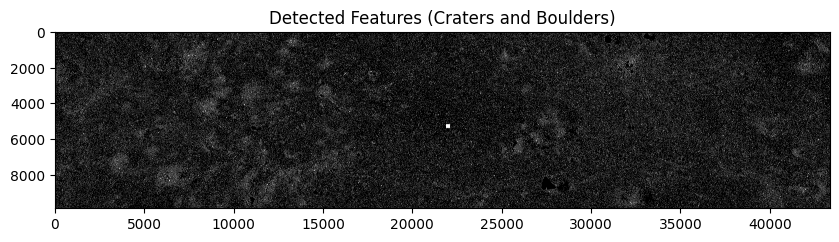

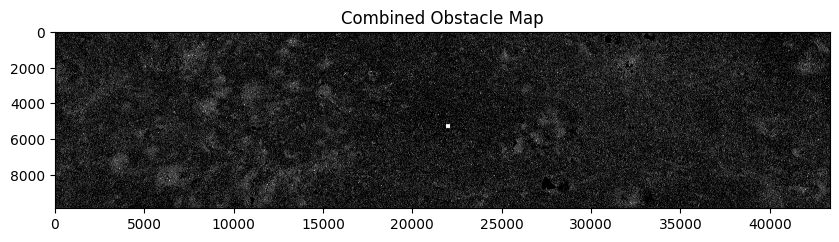

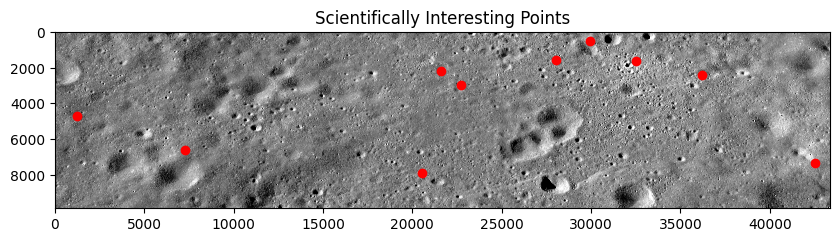

Could not find a path to (6612, 7277)


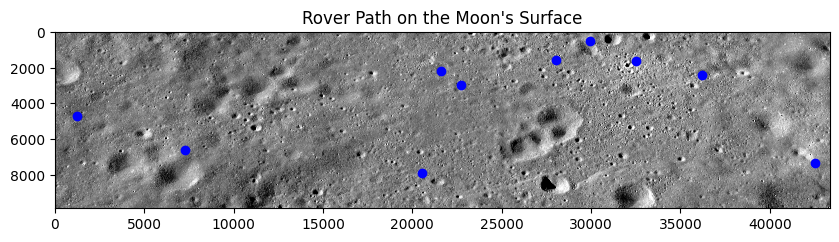

In [3]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.spatial import distance
from heapq import heappop, heappush
import random
from tifffile import imread

# Load the lunar surface image in .tif format
image_path = 'lunar.tif'
image = imread(image_path)
image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

# Load the DEM file (in PNG format)
dem_path = 'output.png'
dem_image = cv2.imread(dem_path, cv2.IMREAD_GRAYSCALE)
dem_image

# Ensure the DEM image matches the size of the lunar surface image
elevation_resized = cv2.resize(dem_image, (image.shape[1], image.shape[0]))
elevation_normalized = (elevation_resized - np.min(elevation_resized)) / (np.max(elevation_resized) - np.min(elevation_resized))

# Apply Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)
# Apply Gaussian Blur to reduce noise
# Use Canny Edge Detection to identify edges
edges = cv2.Canny(blurred_image, 50, 150)
# Apply Gaussian Blur to reduce noise
# Use Canny Edge Detection to identify edges
# Find contours to identify shapes
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an empty obstacle map
obstacle_map = np.zeros_like(image)

# Draw contours on the obstacle map
for contour in contours:
    cv2.drawContours(obstacle_map, [contour], -1, (255), thickness=cv2.FILLED)

# Visualize the detected features
plt.figure(figsize=(10, 10))
plt.imshow(obstacle_map, cmap='gray')
plt.title('Detected Features (Craters and Boulders)')
plt.show()

# Dummy obstacle map from CNN (replace with actual CNN output)
obstacle_map_cnn = np.random.randint(0, 2, size=image.shape, dtype=np.uint8)

# Combine the obstacle maps
combined_obstacle_map = np.maximum(obstacle_map, obstacle_map_cnn)

# Visualize the combined obstacle map
plt.figure(figsize=(10, 10))
plt.imshow(combined_obstacle_map, cmap='gray')
plt.title('Combined Obstacle Map')
plt.show()

# Function to find scientifically interesting points
def find_scientifically_interesting_points(image, num_points=10):
    points = []
    for _ in range(num_points):
        while True:
            x = random.randint(0, image.shape[1] - 1)
            y = random.randint(0, image.shape[0] - 1)
            if combined_obstacle_map[y, x] == 0:  # Ensure the point is not in an obstacle
                points.append((y, x))  # Note the (y, x) order
                break
    return points

interesting_points = find_scientifically_interesting_points(image, num_points=10)

# Visualize the scientifically interesting points
plt.figure(figsize=(10, 10))
plt.imshow(image, cmap='gray')
for point in interesting_points:
    plt.plot(point[1], point[0], 'ro')  # Note the (x, y) order
plt.title('Scientifically Interesting Points')
plt.show()

# A* Algorithm with Stops
def heuristic(a, b):
    return distance.euclidean(a, b)

def astar(array, start, goal, elevation_map):
    neighbors = [(0, 1), (0, -1), (1, 0), (-1, 0)]
    close_set = set()
    came_from = {}
    gscore = {start: 0}
    fscore = {start: heuristic(start, goal)}
    oheap = []
    
    heappush(oheap, (fscore[start], start))
    
    while oheap:
        current = heappop(oheap)[1]
        
        if current == goal:
            data = []
            while current in came_from:
                data.append(current)
                current = came_from[current]
            return data[::-1]
        
        close_set.add(current)
        for i, j in neighbors:
            neighbor = current[0] + i, current[1] + j            
            tentative_g_score = gscore[current] + heuristic(current, neighbor) + elevation_map[neighbor[0], neighbor[1]]
            
            if 0 <= neighbor[0] < array.shape[0]:
                if 0 <= neighbor[1] < array.shape[1]:                
                    if array[neighbor[0]][neighbor[1]] == 1:
                        continue
                else:
                    # array bound y walls
                    continue
            else:
                # array bound x walls
                continue
                
            if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                continue
                
            if tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                came_from[neighbor] = current
                gscore[neighbor] = tentative_g_score
                fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                heappush(oheap, (fscore[neighbor], neighbor))
    
    return []

def astar_with_stops(array, start, stops, elevation_map):
    path = []
    current_start = start
    
    for stop in stops:
        segment = astar(array, current_start, stop, elevation_map)
        if segment:
            path.extend(segment)
            current_start = stop
        else:
            print(f"Could not find a path to {stop}")
            break
    
    return path

# Define start and end points
start_point = (10, 10)
end_point = (image.shape[0] - 20, image.shape[1] - 20)

# Ensure start and end points are within the bounds of the obstacle map
start_point = (min(start_point[0], combined_obstacle_map.shape[0] - 1), min(start_point[1], combined_obstacle_map.shape[1] - 1))
end_point = (min(end_point[0], combined_obstacle_map.shape[0] - 1), min(end_point[1], combined_obstacle_map.shape[1] - 1))

# Add the end point to the goals
goals = interesting_points + [end_point]

# Ensure goals are within the bounds of the map and not in obstacles
goals = [(min(pt[0], combined_obstacle_map.shape[0] - 1), min(pt[1], combined_obstacle_map.shape[1] - 1)) for pt in goals if combined_obstacle_map[pt[0], pt[1]] == 0]

# Find a safe path using the A* algorithm with stops
path = astar_with_stops(combined_obstacle_map, start_point, goals, elevation_normalized)

# Convert path to numpy array for visualization
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image, cmap='gray')
if path.size > 0:
    ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
for point in interesting_points:
    ax.plot(point[1], point[0], 'bo')  # Mark scientifically interesting points in blue
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()


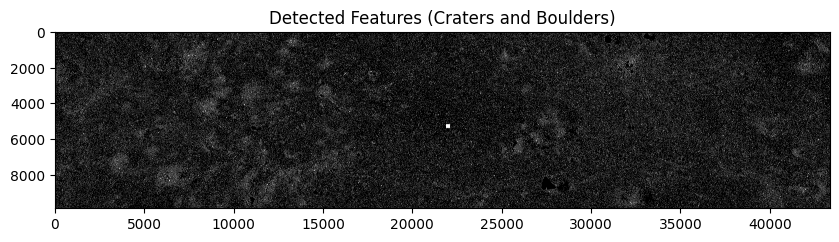

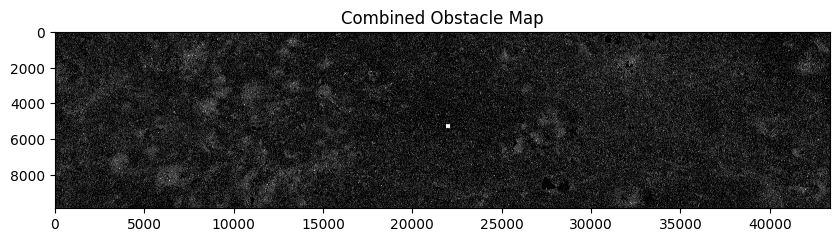

KeyboardInterrupt: 

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.spatial import distance
from heapq import heappop, heappush
import random
from tifffile import imread

# Load the lunar surface image in .tif format
image_path = 'lunar.tif'
image = imread(image_path)
image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

# Load the DEM file (in .tif format)
dem_path = 'output.png'
dem_image = cv2.imread(dem_path, cv2.IMREAD_GRAYSCALE)

# Ensure the DEM image matches the size of the lunar surface image
elevation_resized = cv2.resize(dem_image, (image.shape[1], image.shape[0]))
elevation_normalized = (elevation_resized - np.min(elevation_resized)) / (np.max(elevation_resized) - np.min(elevation_resized))

# Apply Gaussian Blur to reduce noise
blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

# Use Canny Edge Detection to identify edges
edges = cv2.Canny(blurred_image, 50, 150)

# Find contours to identify shapes
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an empty obstacle map
obstacle_map = np.zeros_like(image)

# Draw contours on the obstacle map
for contour in contours:
    cv2.drawContours(obstacle_map, [contour], -1, (255), thickness=cv2.FILLED)

# Visualize the detected features
plt.figure(figsize=(10, 10))
plt.imshow(obstacle_map, cmap='gray')
plt.title('Detected Features (Craters and Boulders)')
plt.show()

# Dummy obstacle map from CNN (replace with actual CNN output)
obstacle_map_cnn = np.random.randint(0, 2, size=image.shape, dtype=np.uint8)

# Combine the obstacle maps
combined_obstacle_map = np.maximum(obstacle_map, obstacle_map_cnn)

# Visualize the combined obstacle map
plt.figure(figsize=(10, 10))
plt.imshow(combined_obstacle_map, cmap='gray')
plt.title('Combined Obstacle Map')
plt.show()

# Function to find scientifically interesting points
def find_scientifically_interesting_points(image, elevation_map, num_points=10):
    points = []
    threshold = np.mean(elevation_map) + np.std(elevation_map)  # Threshold for significant elevation variation
    
    # Select points based on elevation variation and distance to craters
    for _ in range(num_points):
        while True:
            x = random.randint(0, image.shape[1] - 1)
            y = random.randint(0, image.shape[0] - 1)
            
            if combined_obstacle_map[y, x] == 0 and elevation_map[y, x] > threshold:
                points.append((y, x))  # Note the (y, x) order
                break
    return points

interesting_points = find_scientifically_interesting_points(image, elevation_normalized, num_points=10)

# Visualize the scientifically interesting points
plt.figure(figsize=(10, 10))
plt.imshow(image, cmap='gray')
for point in interesting_points:
    plt.plot(point[1], point[0], 'ro')  # Note the (x, y) order
plt.title('Scientifically Interesting Points')
plt.show()

# A* Algorithm with Stops
def heuristic(a, b):
    return distance.euclidean(a, b)

def astar(array, start, goal, elevation_map):
    neighbors = [(0, 1), (0, -1), (1, 0), (-1, 0)]
    close_set = set()
    came_from = {}
    gscore = {start: 0}
    fscore = {start: heuristic(start, goal)}
    oheap = []
    
    heappush(oheap, (fscore[start], start))
    
    while oheap:
        current = heappop(oheap)[1]
        
        if current == goal:
            data = []
            while current in came_from:
                data.append(current)
                current = came_from[current]
            return data[::-1]
        
        close_set.add(current)
        for i, j in neighbors:
            neighbor = current[0] + i, current[1] + j            
            tentative_g_score = gscore[current] + heuristic(current, neighbor) + elevation_map[neighbor[0], neighbor[1]]
            
            if 0 <= neighbor[0] < array.shape[0]:
                if 0 <= neighbor[1] < array.shape[1]:                
                    if array[neighbor[0]][neighbor[1]] == 1:
                        continue
                else:
                    # array bound y walls
                    continue
            else:
                # array bound x walls
                continue
                
            if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                continue
                
            if tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1] for i in oheap]:
                came_from[neighbor] = current
                gscore[neighbor] = tentative_g_score
                fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                heappush(oheap, (fscore[neighbor], neighbor))
    
    return []

def astar_with_stops(array, start, stops, elevation_map):
    path = []
    current_start = start
    
    for stop in stops:
        segment = astar(array, current_start, stop, elevation_map)
        if segment:
            path.extend(segment)
            current_start = stop
        else:
            print(f"Could not find a path to {stop}")
            break
    
    return path

# Define start and end points
start_point = (10, 10)
end_point = (image.shape[0] - 20, image.shape[1] - 20)

# Ensure start and end points are within the bounds of the obstacle map
start_point = (min(start_point[0], combined_obstacle_map.shape[0] - 1), min(start_point[1], combined_obstacle_map.shape[1] - 1))
end_point = (min(end_point[0], combined_obstacle_map.shape[0] - 1), min(end_point[1], combined_obstacle_map.shape[1] - 1))

# Add the end point to the goals
goals = interesting_points + [end_point]

# Ensure goals are within the bounds of the map and not in obstacles
goals = [(min(pt[0], combined_obstacle_map.shape[0] - 1), min(pt[1], combined_obstacle_map.shape[1] - 1)) for pt in goals if combined_obstacle_map[pt[0], pt[1]] == 0]

# Find a safe path using the A* algorithm with stops
path = astar_with_stops(combined_obstacle_map, start_point, goals, elevation_normalized)

# Convert path to numpy array for visualization
path = np.array(path)

# Visualize the path on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image, cmap='gray')
if path.size > 0:
    ax.plot(path[:, 1], path[:, 0], color='red', marker='o', markersize=2, linestyle='-', linewidth=1)
for point in interesting_points:
    ax.plot(point[1], point[0], 'bo')  # Mark scientifically interesting points in blue
ax.set_title('Rover Path on the Moon\'s Surface')
plt.show()
